# Prepare dataset

Here is the link to download Flickr8k dataset: http://academictorrents.com/details/9dea07ba660a722ae1008c4c8afdd303b6f6e53b

It is a torrent file. And Flickr8K is quite heavy (1.2GB at total). So basicly, we shouldn't download it to our own computer and train it. 

And i search for solution on Google, and i found a way. We can use Google Colab to download Torrent file directly to Google Drive. And then we can import our dataset from Google Drive to Colab.

Torrent to Google Drive using Colab: https://github.com/FKLC/Torrent-To-Google-Drive-Downloader

This way is supper fast!!! Google Colab can download 1.2GB torrent file and upload it to our Google Drive in just about a 30s.

Just make sure your Google Drive has more than 1.2GB of free space.

And we need to use Glove so that you should download it and store in GDrive.
https://nlp.stanford.edu/projects/glove/

Use these command in Colab cell to download and copy to Google Drive:



```
!wget http://nlp.stanford.edu/data/glove.6B.zip

%cp -r 'glove.6B.zip' 'gdrive/My Drive'
```



# Mount Google Drive and import Dataset to Google Colab



In [0]:
from google.colab import drive
drive.mount('/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /gdrive


In [0]:
%cp -r '/gdrive/My Drive/Torrent/Flickr8k' /content
%cp -r '/gdrive/My Drive/Colab Datasets/glove.6B.zip' /content

**By the way, DO NOT EXPAND Flickr8k_Dataset. It may crash your browser.**

In [0]:
!unzip '/content/Flickr8k/Flickr8k_Dataset.zip' -d /content
!unzip '/content/Flickr8k/Flickr8k_text.zip' -d /content
!unzip '/content/glove.6B.zip' -d /content

Archive:  /content/Flickr8k/Flickr8k_Dataset.zip
   creating: /content/Flicker8k_Dataset/
  inflating: /content/Flicker8k_Dataset/1000268201_693b08cb0e.jpg  
   creating: /content/__MACOSX/
   creating: /content/__MACOSX/Flicker8k_Dataset/
  inflating: /content/__MACOSX/Flicker8k_Dataset/._1000268201_693b08cb0e.jpg  
  inflating: /content/Flicker8k_Dataset/1001773457_577c3a7d70.jpg  
  inflating: /content/__MACOSX/Flicker8k_Dataset/._1001773457_577c3a7d70.jpg  
  inflating: /content/Flicker8k_Dataset/1002674143_1b742ab4b8.jpg  
  inflating: /content/__MACOSX/Flicker8k_Dataset/._1002674143_1b742ab4b8.jpg  
  inflating: /content/Flicker8k_Dataset/1003163366_44323f5815.jpg  
  inflating: /content/__MACOSX/Flicker8k_Dataset/._1003163366_44323f5815.jpg  
  inflating: /content/Flicker8k_Dataset/1007129816_e794419615.jpg  
  inflating: /content/__MACOSX/Flicker8k_Dataset/._1007129816_e794419615.jpg  
  inflating: /content/Flicker8k_Dataset/1007320043_627395c3d8.jpg  
  inflating: /content/__M

In [0]:
%pwd
%ls

CrowdFlowerAnnotations.txt  Flickr_8k.testImages.txt   glove.6B.50d.txt
ExpertAnnotations.txt       Flickr8k.token.txt         glove.6B.zip
Flicker8k_Dataset/          Flickr_8k.trainImages.txt  __MACOSX/
Flickr8k/                   glove.6B.100d.txt          readme.txt
Flickr_8k.devImages.txt     glove.6B.200d.txt
Flickr8k.lemma.token.txt    glove.6B.300d.txt


# Import Library

In [0]:
import numpy as np
from numpy import array
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import string
import os
from PIL import Image
import glob
from pickle import dump, load
import pickle
from time import time
from keras.preprocessing import sequence
from keras.models import Sequential
from keras.layers import LSTM, Embedding, TimeDistributed, Dense, RepeatVector,\
                         Activation, Flatten, Reshape, concatenate, Dropout, BatchNormalization
from keras.optimizers import Adam, RMSprop
from keras.layers.wrappers import Bidirectional
from keras.layers.merge import add
from keras.applications.inception_v3 import InceptionV3
from keras.preprocessing import image
from keras.models import Model
from keras import Input, layers
from keras import optimizers
from keras.applications.inception_v3 import preprocess_input
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical

# Read dataset



In [0]:
# load doc into memory
def load_doc(filename):
    with open(filename, 'r') as file:
        text = file.read()
        
    return text

file_text = 'Flickr8k.token.txt'
text = load_doc(file_text)
    
# some first lines
print(text[0:410])
print(text[410:865])

1000268201_693b08cb0e.jpg#0	A child in a pink dress is climbing up a set of stairs in an entry way .
1000268201_693b08cb0e.jpg#1	A girl going into a wooden building .
1000268201_693b08cb0e.jpg#2	A little girl climbing into a wooden playhouse .
1000268201_693b08cb0e.jpg#3	A little girl climbing the stairs to her playhouse .
1000268201_693b08cb0e.jpg#4	A little girl in a pink dress going into a wooden cabin .

1001773457_577c3a7d70.jpg#0	A black dog and a spotted dog are fighting
1001773457_577c3a7d70.jpg#1	A black dog and a tri-colored dog playing with each other on the road .
1001773457_577c3a7d70.jpg#2	A black dog and a white dog with brown spots are staring at each other in the street .
1001773457_577c3a7d70.jpg#3	Two dogs of different breeds looking at each other on the road .
1001773457_577c3a7d70.jpg#4	Two dogs on pavement moving toward each other .


In [0]:
def load_descriptions(text):
    descriptions = dict()

    for line in text.split('\n'):
        # split line by white space
        tokens = line.split()

        if len(line) < 2:
            continue

        # take the first token as the image id, the rest as the description
        image_id, image_desc = tokens[0], tokens[1:]
        
        # extract filename from image id
        image_id = image_id.split('.')[0]
        
        # convert description tokens back to string
        image_desc = ' '.join(image_desc)
        
        # create the list if needed
        if image_id not in descriptions:
            descriptions[image_id] = list()
            
        # store description
        descriptions[image_id].append(image_desc)
        
    return descriptions

descriptions = load_descriptions(text)
print('Loaded: %d ' % len(descriptions))

Loaded: 8092 


In [0]:
list(descriptions.keys())[:5]

['1000268201_693b08cb0e',
 '1001773457_577c3a7d70',
 '1002674143_1b742ab4b8',
 '1003163366_44323f5815',
 '1007129816_e794419615']

In [0]:
descriptions['1000268201_693b08cb0e']

['A child in a pink dress is climbing up a set of stairs in an entry way .',
 'A girl going into a wooden building .',
 'A little girl climbing into a wooden playhouse .',
 'A little girl climbing the stairs to her playhouse .',
 'A little girl in a pink dress going into a wooden cabin .']

# Text Data Cleaning

When we deal with text, we generally perform some basic cleaning like:
- lower-casing all the words, so that 'hello' and 'Hello' will not be two words.
- removing special tokens (like ‘%’, ‘$’, ‘#’, etc.)
- eliminating words which contain numbers (like ‘hey199’, etc.)

In [0]:
def clean_descriptions(descriptions):
  
    # prepare translation table for removing punctuation
    # mapped all punctuation to none
    table = str.maketrans('', '', string.punctuation)
    
    # 
    for key, desc_list in descriptions.items():
        for i in range(len(desc_list)):
            desc = desc_list[i]
            
            # tokenize
            desc = desc.split()
            
            # convert to lower case
            desc = [word.lower() for word in desc]
            
            # remove punctuation from each token
            desc = [w.translate(table) for w in desc]
            
            # remove hanging 's' and 'a'
            desc = [word for word in desc if len(word)>1]
            
            # remove tokens with numbers in them
            # .isalpha() check if string only conatin alphabet character A->Z,a->z or not
            desc = [word for word in desc if word.isalpha()]
            
            # combine as string
            desc_list[i] =  ' '.join(desc)

# clean descriptions
clean_descriptions(descriptions)

In [0]:
descriptions['1000268201_693b08cb0e']

['child in pink dress is climbing up set of stairs in an entry way',
 'girl going into wooden building',
 'little girl climbing into wooden playhouse',
 'little girl climbing the stairs to her playhouse',
 'little girl in pink dress going into wooden cabin']

Generate vocabulary contain all unique words in our image caption.

In [0]:
# convert the loaded descriptions into a vocabulary of words
def to_vocabulary(descriptions):
    # build a list of all description strings
    all_desc = set()
    for key in descriptions.keys():
        [all_desc.update(d.split()) for d in descriptions[key]]
    return all_desc

# summarize vocabulary
vocabulary = to_vocabulary(descriptions)
print('There are: %d' % len(vocabulary), 'unique words in all image caption.')

There are: 8763 unique words in all image caption.


Save our clean descriptions

format:

1000268201_693b08cb0e child in pink dress is climbing up set of stairs in an entry way

1000268201_693b08cb0e girl going into wooden building

1000268201_693b08cb0e little girl climbing into wooden playhouse

1000268201_693b08cb0e little girl climbing the stairs to her playhouse

1000268201_693b08cb0e little girl in pink dress going into wooden cabin

In [0]:
# save descriptions to file, one per line
def save_descriptions(descriptions, filename):
    lines = list()
    for key, desc_list in descriptions.items():
        for desc in desc_list:
            lines.append(key + ' ' + desc)
    data = '\n'.join(lines)
    file = open(filename, 'w')
    file.write(data)
    file.close()

save_descriptions(descriptions, 'descriptions.txt')

# Image set path and Image set description

**Generate a set of train image's name** *(Only contain file name, remove ".img")*

In [0]:
# load a pre-defined list of photo identifiers
def load_set(filename):
    doc = load_doc(filename)
    dataset = list()
    # process line by line
    for line in doc.split('\n'):
        # skip empty lines
        if len(line) < 1:
            continue
        # get the image identifier
        identifier = line.split('.')[0]
        dataset.append(identifier)
    return set(dataset)

# load training dataset (6K)
filename = 'Flickr_8k.trainImages.txt'
train = load_set(filename)
print('Dataset: %d' % len(train))
print(train)

Dataset: 6000
{'2200901777_f6c168bd32', '3294964868_16f4f9fa9d', '3705976184_53ae07e898', '3338217927_3c5cf3f7c6', '3518118675_5053b3f738', '2393971707_bce01ae754', '2533010184_ef2fd71297', '2603690144_7a28b1d13c', '317641829_ab2607a6c0', '3223809913_ae15d14d9a', '2325816912_b3bb41cdbb', '1253264731_e7c689eca5', '2622517932_57c52c376f', '3335097235_538f4777c3', '3069037969_bb7319e0dc', '3512033659_7e8a0c2ffa', '2258662398_2797d0eca8', '697778778_b52090709d', '3679405397_bb130ea3c2', '3259992722_4c5e895734', '3532192208_64b069d05d', '2662816021_ac474e0fde', '3215238223_29de2b35cb', '2191453879_11dfe2ba3a', '2862481071_86c65d46fa', '256439287_990ac4a761', '3190677999_60bbd330fd', '3256603992_67312b5a36', '445861800_75fc6a8c16', '3280672302_2967177653', '1213336750_2269b51397', '1542033433_5453d4c466', '3294717824_3bb7b5d1c8', '2418191216_82711d5c5c', '2301379282_5fbcf230d1', '1806580620_a8fe0fb9f8', '3454754632_977c1523be', '255091930_aa2b5c0eb9', '3468346269_9d162aacfe', '2730938963_c4e

**Full path of all images in dataset**

In [0]:
# Below path contains all the images
images = 'Flicker8k_Dataset/'

# Create a list of all image names in the directory
img = glob.glob(images + '*.jpg')

print(img[0])

Flicker8k_Dataset/1801188148_a176954965.jpg


**Full path of train images**

In [0]:
# Below file conatains the names of images to be used in train data
train_images_file = 'Flickr_8k.trainImages.txt'

# Read the train image names in a set
train_images = set(open(train_images_file, 'r').read().strip().split('\n'))

# Create a list of all the training images with their full path names
train_img = []

for i in img: # img is list of full path names of all images
    if i[len(images):] in train_images: # Check if the image belongs to training set
        train_img.append(i) # Add it to the list of train images
        

print(len(train_img))
print(train_img[0:2])

6000
['Flicker8k_Dataset/1801188148_a176954965.jpg', 'Flicker8k_Dataset/2755053974_5cc157512e.jpg']


**Full path of test images**

In [0]:
# Below file conatains the names of images to be used in test data
test_images_file = 'Flickr_8k.testImages.txt'

# Read the test image names in a set
test_images = set(open(test_images_file, 'r').read().strip().split('\n'))

# Create a list of all the test images with their full path names
test_img = []

for i in img: # img is list of full path names of all images
    if i[len(images):] in test_images: # Check if the image belongs to test set
        test_img.append(i) # Add it to the list of test images
        
print(len(test_img))
print(test_img[0:2])

1000
['Flicker8k_Dataset/2054869561_ff723e9eab.jpg', 'Flicker8k_Dataset/751109943_2a7f8e117f.jpg']


**Get the train description**

In [0]:
# load clean descriptions into memory
def load_clean_descriptions(filename, dataset):
    # load document
    doc = load_doc(filename)
    descriptions = dict()
    for line in doc.split('\n'):
        # split line by white space
        tokens = line.split()
        
        # split id from description
        image_id, image_desc = tokens[0], tokens[1:]
        
        # skip images not in the set
        if image_id in dataset:
            # create list
            if image_id not in descriptions:
                descriptions[image_id] = list()
            # wrap description in tokens
            desc = 'startseq ' + ' '.join(image_desc) + ' endseq'
            # store
            descriptions[image_id].append(desc)
    return descriptions

# descriptions
train_descriptions = load_clean_descriptions('descriptions.txt', train)
print('Descriptions: train=%d' % len(train_descriptions))

Descriptions: train=6000


# Preprocess Image 
(*Extract feature of image using Google Inception Net V3*)


**Convert image to require size of Google Net**

In [0]:
def preprocess(image_path):
    # Convert all the images to size 299x299 as expected by the inception v3 model
    img = image.load_img(image_path, target_size=(299, 299))
    # Convert PIL image to numpy array of 3-dimensions
    x = image.img_to_array(img)
    # Add one more dimension
    x = np.expand_dims(x, axis=0)
    # preprocess the images using preprocess_input() from inception module
    x = preprocess_input(x)
    return x

In [0]:
# Load the inception v3 model
model = InceptionV3(weights='imagenet') # pretrained weight














96116736/96112376 [==============================] - 4s 0us/step


In [0]:
# Create a new model, by removing the last layer (output layer) from the inception v3
model_new = Model(model.input, model.layers[-2].output)

In [0]:
# Function to encode a given image into a vector of size (2048, )
def encode(image):
    image = preprocess(image) # preprocess the image
    fea_vec = model_new.predict(image) # Get the encoding vector for the image
    fea_vec = np.reshape(fea_vec, fea_vec.shape[1]) # reshape from (1, 2048) to (2048, )
    return fea_vec

In [0]:
# Call the funtion to encode all the train images
# This will take a while on CPU - Execute this only once
start = time()
encoding_train = {}
for img in train_img:
    encoding_train[img[len(images):]] = encode(img)
print("Time taken in seconds =", time()-start)

Time taken in seconds = 265.0840120315552


In [0]:
if not os.path.exists("Pickle"):
    try:
        os.makedirs("Pickle")
    except OSError as exc: # Guard against race condition
        if exc.errno != errno.EEXIST:
            raise
            
# Save the bottleneck train features to disk
with open("Pickle/encoded_train_images.pkl", "wb") as encoded_pickle:
    pickle.dump(encoding_train, encoded_pickle)

In [0]:
# Call the funtion to encode all the test images - Execute this only once
start = time()
encoding_test = {}
for img in test_img:
    encoding_test[img[len(images):]] = encode(img)
print("Time taken in seconds =", time()-start)



Time taken in seconds = 42.36568236351013


In [0]:
# Save the bottleneck test features to disk
with open("Pickle/encoded_test_images.pkl", "wb") as encoded_pickle:
    pickle.dump(encoding_test, encoded_pickle)

**Load encoded image**

In [0]:
train_features = load(open("Pickle/encoded_train_images.pkl", "rb"))
print('Photos: train=%d' % len(train_features))

Photos: train=6000


In [0]:
# Create a list of all the training captions
all_train_captions = []
for key, val in train_descriptions.items():
    for cap in val:
        all_train_captions.append(cap)

print(len(all_train_captions))
print(all_train_captions[0])

30000
startseq child in pink dress is climbing up set of stairs in an entry way endseq


**Remove word occur less than ten times (not important words)**

Note that Vocab built only on Train set, because we don't know any thing about Test set.

In [0]:
# Consider only words which occur at least 10 times in the corpus
word_count_threshold = 10
word_counts = {}
nsents = 0
for sent in all_train_captions:
    nsents += 1
    for w in sent.split(' '):
        word_counts[w] = word_counts.get(w, 0) + 1

vocab = [w for w in word_counts if word_counts[w] >= word_count_threshold]
print('preprocessed words %d -> %d' % (len(word_counts), len(vocab)))

preprocessed words 7578 -> 1651


# Data Preprocessing — Captions

In [0]:
ixtoword = {}
wordtoix = {}

ix = 1
for w in vocab:
    wordtoix[w] = ix
    ixtoword[ix] = w
    ix += 1

print(ix)

1652


In [0]:
vocab_size = len(ixtoword) + 1 # one for appended 0's
vocab_size

1652

In [0]:
# convert a dictionary of clean descriptions to a list of descriptions
def to_lines(descriptions):
    all_desc = list()
    for key in descriptions.keys():
        [all_desc.append(d) for d in descriptions[key]]
    return all_desc

# calculate the length of the description with the most words
def max_length(descriptions):
    lines = to_lines(descriptions)
    return max(len(d.split()) for d in lines)

# determine the maximum sequence length
max_length = max_length(train_descriptions)
print('Description Length: %d' % max_length)

Description Length: 34


In [0]:
# data generator, intended to be used in a call to model.fit_generator()
def data_generator(descriptions, photos, wordtoix, max_length, num_photos_per_batch):
    X1, X2, y = list(), list(), list()
    n=0
    # loop for ever over images
    while 1:
        for key, desc_list in descriptions.items():
            n+=1
            # retrieve the photo feature
            photo = photos[key+'.jpg']
            for desc in desc_list:
                # encode the sequence
                seq = [wordtoix[word] for word in desc.split(' ') if word in wordtoix]
                # split one sequence into multiple X, y pairs
                for i in range(1, len(seq)):
                    # split into input and output pair
                    in_seq, out_seq = seq[:i], seq[i]
                    
                    # pad input sequence
                    # add 0 to in_seq to make len(in_seq) = max_length
                    in_seq = pad_sequences([in_seq], maxlen=max_length)[0]
                    
                    # encode output sequence
                    out_seq = to_categorical([out_seq], num_classes=vocab_size)[0]
                    # store
                    X1.append(photo)
                    X2.append(in_seq)
                    y.append(out_seq)
                    
            # yield the batch data
            # generate each batch size when called
            # so we don't need a lot of memory to store data
            # and the code will run faster with small batch
            if n==num_photos_per_batch:
                yield [[array(X1), array(X2)], array(y)]
                X1, X2, y = list(), list(), list()
                n=0

# Word Embedding with Glove

In [0]:
embeddings_index = {} # empty dictionary
f = open('glove.6B.200d.txt', encoding="utf-8")

for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs
f.close()

print('Found %s word vectors.' % len(embeddings_index))

Found 400000 word vectors.


In [0]:
embedding_dim = 200

# Get 200-dim dense vector for each of the 10000 words in out vocabulary
embedding_matrix = np.zeros((vocab_size, embedding_dim))

for word, i in wordtoix.items():
    #if i < max_words:
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        # Words not found in the embedding index will be all zeros
        embedding_matrix[i] = embedding_vector

In [0]:
embedding_matrix.shape

(1652, 200)

# Build Network

In [0]:
# image feature extractor model
inputs1 = Input(shape=(2048,))
fe1 = Dropout(0.5)(inputs1)
fe2 = Dense(256, activation='relu')(fe1)

# partial caption sequence model
inputs2 = Input(shape=(max_length,)) # max_length = 34
# 1652 vocabs, vetor dim = 200
se1 = Embedding(vocab_size, embedding_dim, mask_zero=True)(inputs2) 
se2 = Dropout(0.5)(se1)
se3 = LSTM(256)(se2)

# decoder (feed forward) model
decoder1 = add([fe2, se3])
decoder2 = Dense(256, activation='relu')(decoder1)
outputs = Dense(vocab_size, activation='softmax')(decoder2)

# merge the two input models
model = Model(inputs=[inputs1, inputs2], outputs=outputs)

Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


In [0]:
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            (None, 34)           0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            (None, 2048)         0                                            
__________________________________________________________________________________________________
embedding_1 (Embedding)         (None, 34, 200)      330400      input_3[0][0]                    
__________________________________________________________________________________________________
dropout_1 (Dropout)             (None, 2048)         0           input_2[0][0]                    
____________________________________________________________________________________________

In [0]:
model.layers[2]

**Use pretrain Glove model as weight**

In [0]:
model.layers[2].set_weights([embedding_matrix])
model.layers[2].trainable = False # don't update during back propagation

In [0]:
model.compile(loss='categorical_crossentropy', optimizer='adam')

In [0]:
if not os.path.exists("model_weights"):
    try:
        os.makedirs("model_weights")
    except OSError as exc: # Guard against race condition
        if exc.errno != errno.EEXIST:
            raise

In [0]:
epochs = 10
number_pics_per_bath = 3
steps = len(train_descriptions)//number_pics_per_bath

In [0]:
for i in range(epochs):
    generator = data_generator(train_descriptions, train_features, wordtoix, max_length, number_pics_per_bath)
    model.fit_generator(generator, epochs=1, steps_per_epoch=steps, verbose=1)
    model.save('model_weights/model_' + str(i) + '.h5')



Epoch 1/1
2000/2000 [==============================] - 251s 125ms/step - loss: 4.1097
Epoch 1/1
2000/2000 [==============================] - 247s 123ms/step - loss: 3.4087
Epoch 1/1
2000/2000 [==============================] - 246s 123ms/step - loss: 3.1923
Epoch 1/1
2000/2000 [==============================] - 247s 124ms/step - loss: 3.0591
Epoch 1/1
2000/2000 [==============================] - 247s 124ms/step - loss: 2.9674
Epoch 1/1
2000/2000 [==============================] - 248s 124ms/step - loss: 2.8958
Epoch 1/1
2000/2000 [==============================] - 249s 124ms/step - loss: 2.8378
Epoch 1/1
2000/2000 [==============================] - 248s 124ms/step - loss: 2.7911
Epoch 1/1
2000/2000 [==============================] - 249s 125ms/step - loss: 2.7492
Epoch 1/1
2000/2000 [==============================] - 246s 123ms/step - loss: 2.7158


In [0]:
for i in range(epochs):
    generator = data_generator(train_descriptions, train_features, wordtoix, max_length, number_pics_per_bath)
    model.fit_generator(generator, epochs=1, steps_per_epoch=steps, verbose=1)
    model.save('model_weights/model_' + str((i+10)) + '.h5')

Epoch 1/1
2000/2000 [==============================] - 245s 122ms/step - loss: 2.6869
Epoch 1/1
2000/2000 [==============================] - 242s 121ms/step - loss: 2.6611
Epoch 1/1
2000/2000 [==============================] - 243s 122ms/step - loss: 2.6405
Epoch 1/1
2000/2000 [==============================] - 245s 123ms/step - loss: 2.6191
Epoch 1/1
2000/2000 [==============================] - 243s 121ms/step - loss: 2.6012
Epoch 1/1
2000/2000 [==============================] - 244s 122ms/step - loss: 2.5835
Epoch 1/1
2000/2000 [==============================] - 244s 122ms/step - loss: 2.5669
Epoch 1/1
2000/2000 [==============================] - 244s 122ms/step - loss: 2.5535
Epoch 1/1
2000/2000 [==============================] - 244s 122ms/step - loss: 2.5413
Epoch 1/1
2000/2000 [==============================] - 245s 123ms/step - loss: 2.5290


In [0]:
model.optimizer.lr = 0.0001
epochs = 10
number_pics_per_bath = 6
steps = len(train_descriptions)//number_pics_per_bath

In [0]:
for i in range(epochs):
    generator = data_generator(train_descriptions, train_features, wordtoix, max_length, number_pics_per_bath)
    model.fit_generator(generator, epochs=1, steps_per_epoch=steps, verbose=1)
    #model.save('model_weights/model_' + str(i+20) + '.h5')

Epoch 1/1
1000/1000 [==============================] - 132s 132ms/step - loss: 2.4443
Epoch 1/1
1000/1000 [==============================] - 131s 131ms/step - loss: 2.4300
Epoch 1/1
1000/1000 [==============================] - 130s 130ms/step - loss: 2.4235
Epoch 1/1
1000/1000 [==============================] - 133s 133ms/step - loss: 2.4100
Epoch 1/1
1000/1000 [==============================] - 133s 133ms/step - loss: 2.4014
Epoch 1/1
1000/1000 [==============================] - 133s 133ms/step - loss: 2.3949
Epoch 1/1
1000/1000 [==============================] - 130s 130ms/step - loss: 2.3845
Epoch 1/1
1000/1000 [==============================] - 131s 131ms/step - loss: 2.3793
Epoch 1/1
1000/1000 [==============================] - 131s 131ms/step - loss: 2.3739
Epoch 1/1
1000/1000 [==============================] - 131s 131ms/step - loss: 2.3662


In [0]:
model.save_weights('model_weights/model_30.h5')

# Load saved model

In [0]:
model.load_weights('model_weights/model_30.h5')

In [0]:
images = 'Flicker8k_Dataset/'

In [0]:
with open("Pickle/encoded_test_images.pkl", "rb") as encoded_pickle:
    encoding_test = load(encoded_pickle)

In [0]:
def greedySearch(photo):
    in_text = 'startseq'
    for i in range(max_length):
        sequence = [wordtoix[w] for w in in_text.split() if w in wordtoix]
        sequence = pad_sequences([sequence], maxlen=max_length)
        yhat = model.predict([photo,sequence], verbose=0)
        yhat = np.argmax(yhat)
        word = ixtoword[yhat]
        in_text += ' ' + word
        if word == 'endseq':
            break
    final = in_text.split()
    final = final[1:-1]
    final = ' '.join(final)
    return final

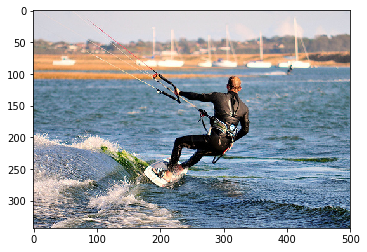

Image 980 :  man in black wetsuit is surfing on the water


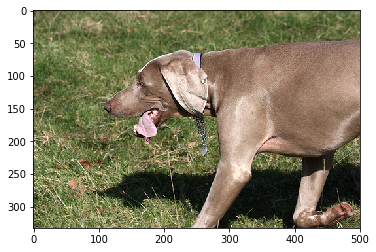

Image 98 :  brown dog is running through the grass


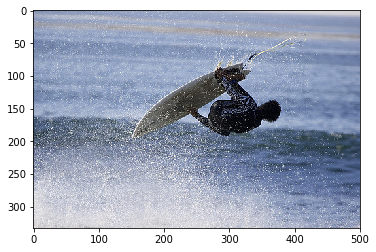

Image 86 :  man is surfing in the ocean


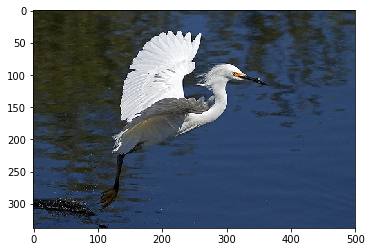

Image 150 :  white crane flying over the water


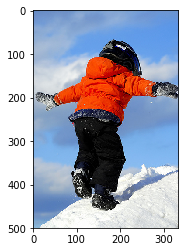

Image 160 :  child in red coat is standing in the snow


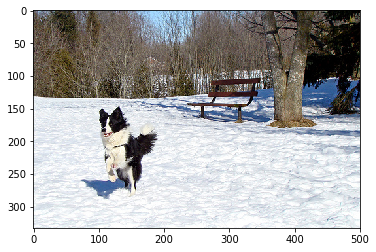

Image 178 :  dog is running through the snow


In [0]:
id_img_correct = [980, 98, 86, 150, 160, 178]
for z in id_img_correct:
    pic = list(encoding_test.keys())[z]
    image = encoding_test[pic].reshape((1,2048))
    x=plt.imread(images+pic)
    plt.imshow(x)
    plt.show()
    print("Image", z, ": ",greedySearch(image))

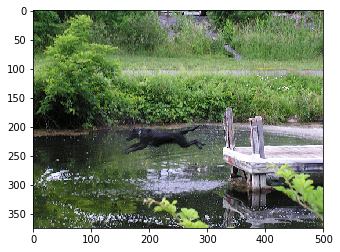

boy in life jacket is climbing up large rock


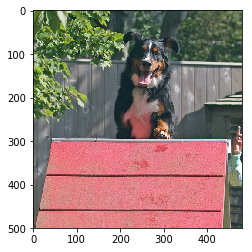

black and white dog is running through the grass


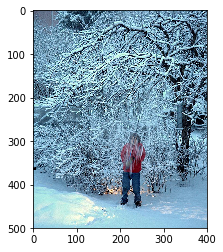

two people are walking on snowy path


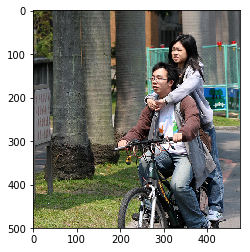

man in black shirt and jeans is riding unicycle down the street


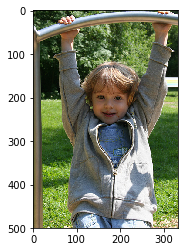

child in red shirt is sitting on go swing


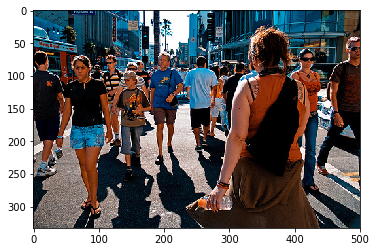

woman in white dress and beige pants walks down the street


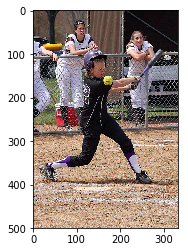

boy in red baseball uniform is grabbing baseball bat


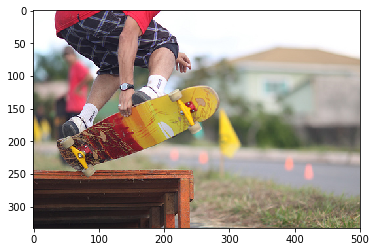

boy in red shirt is jumping off of slide


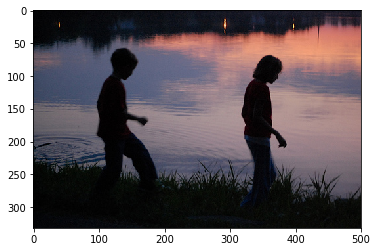

two people stand on the shore looking at the ocean


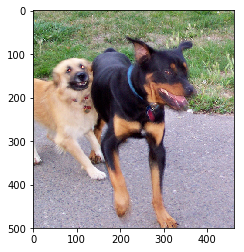

two dogs are running through the grass


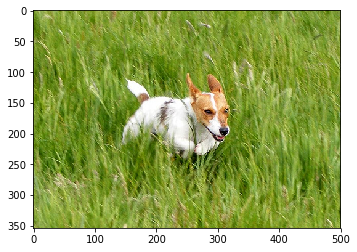

dog with stick in its mouth


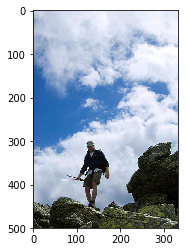

man is standing on top of cliff


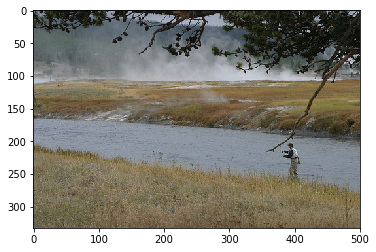

man fishes in foggy lake


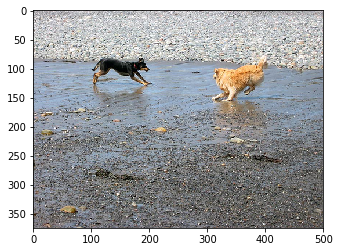

two dogs play in the water


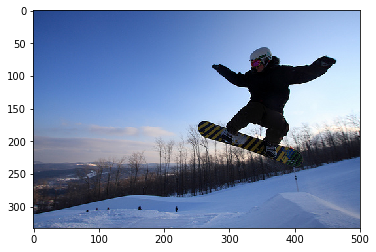

man in red coat speaks on snowboard


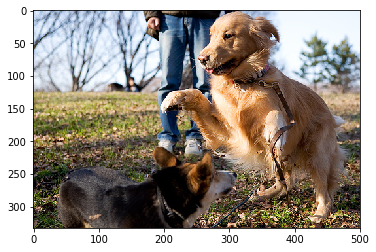

two dogs play in the grass


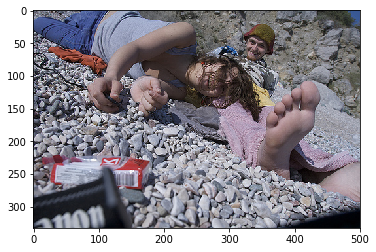

man in black shirt and cast smokes cigarette


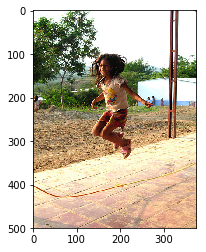

little girl in pink shirt hangs upside down from the grass


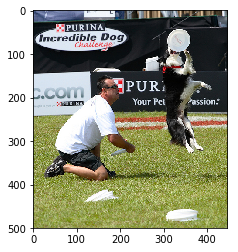

dog jumps over hurdle


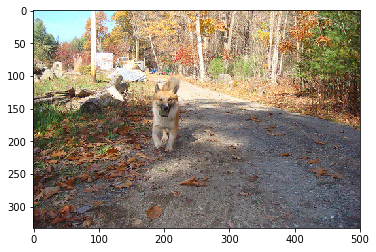

dog is running through the woods


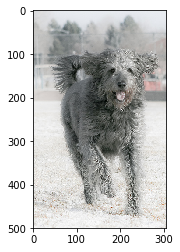

black dog runs through the water


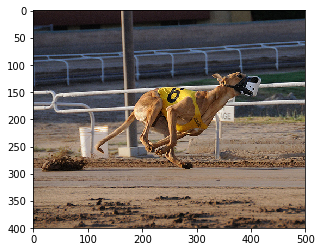

two dogs are running in the grass


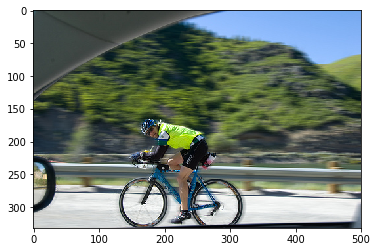

man in blue shirt and jeans is riding bike on the street


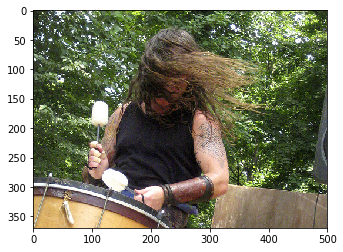

man in black shirt and cast smokes cigarette


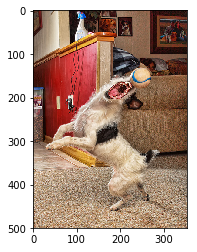

man sits on bench with his dog wrapped


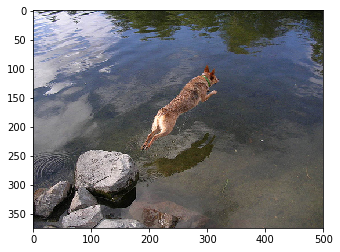

beagle is walking on the shoreline


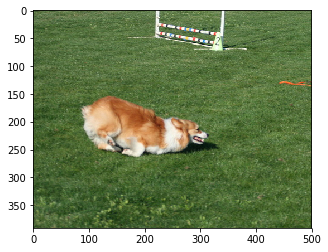

dog jumps over hurdle


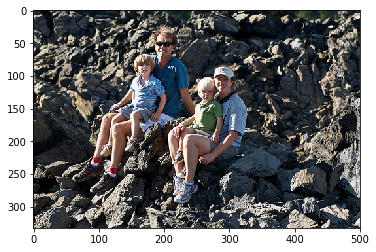

man in red shirt climbs natural rock face


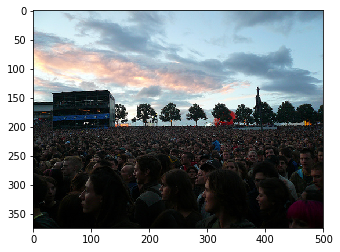

group of people are standing in front of building


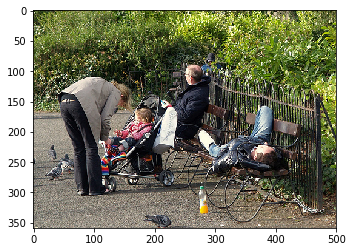

man in black jacket and jeans is riding bike in the rain


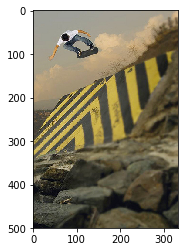

man is standing on the edge of the ocean


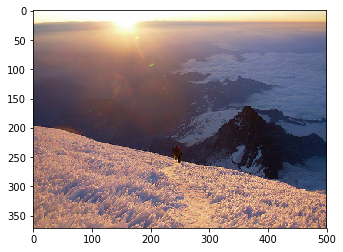

man stands on rock overlooking waterfall


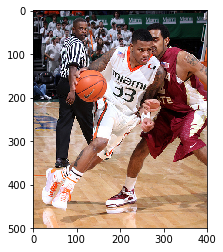

basketball player dribbles the ball


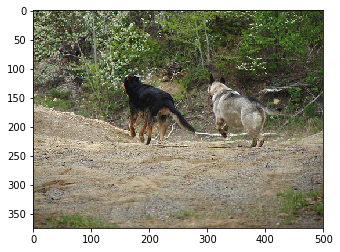

dog runs through the woods


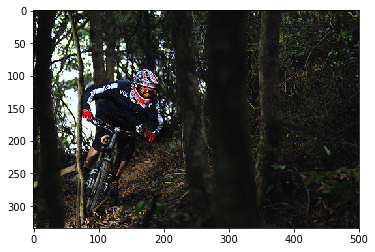

man in blue jeans and helmet is riding dirt bike


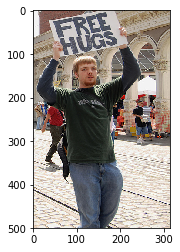

man in black shirt and jeans stands on the sidewalk


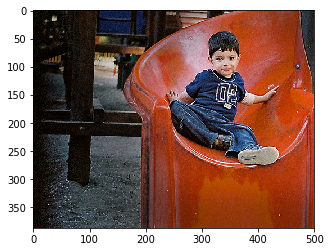

man in black shirt and jeans is walking past mural of brick building


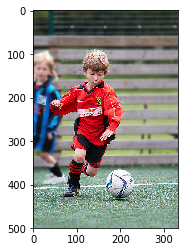

two boys in red uniforms play soccer


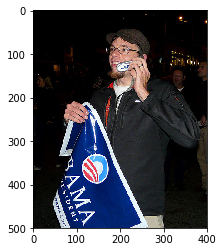

man in black shirt and cast smokes cigarette


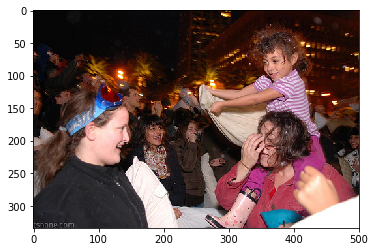

woman in red shirt is standing next to man in white suit


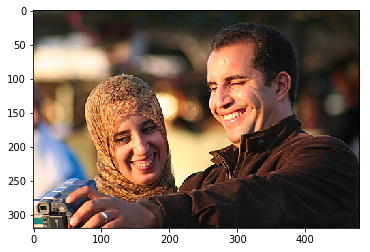

man with beard and beard is wearing bandanna


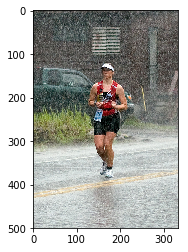

man in red shirt and jeans is walking on the grass


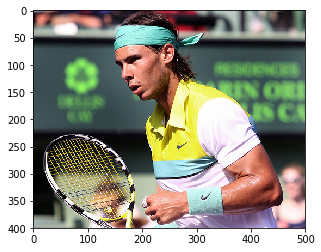

the tennis player holds the ball


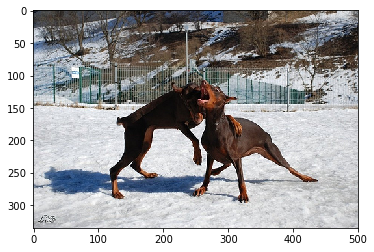

brown dog is running through the grass


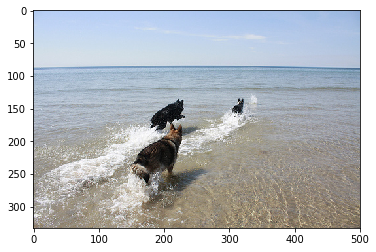

dog runs through the ocean


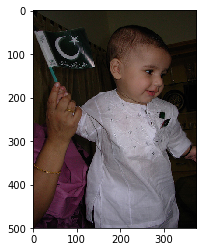

man in black shirt is sitting on the grass with his head


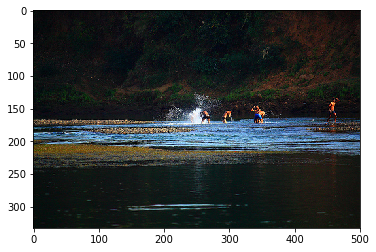

two people are walking through the water


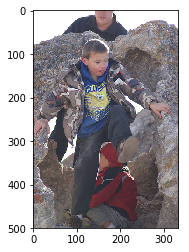

man is climbing up sheer cliff face


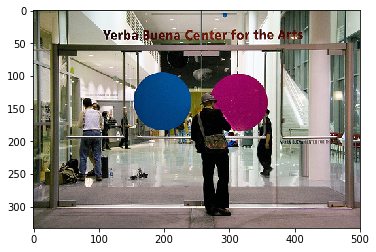

man in black shirt and tie is standing next to woman in red shirt


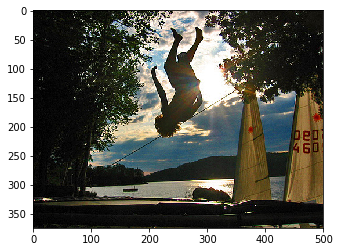

girl in pink shirt is jumping off of the water


In [0]:
for i in range(50):
    z=i + 250
    pic = list(encoding_test.keys())[z]
    image = encoding_test[pic].reshape((1,2048))
    x=plt.imread(images+pic)
    plt.imshow(x)
    plt.show()
    print(greedySearch(image))